# Get our workshop ready

In [1]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU avaliablity
print("GPU", "avaliable" if tf.config.list_physical_devices("GPU") else "Not")

TF version: 2.12.0
TF Hub version: 0.14.0
GPU avaliable


# Getting our data ready

Turning images into tensors (numerical representation)

In [2]:
# Checkout labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/dog-vision-project/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

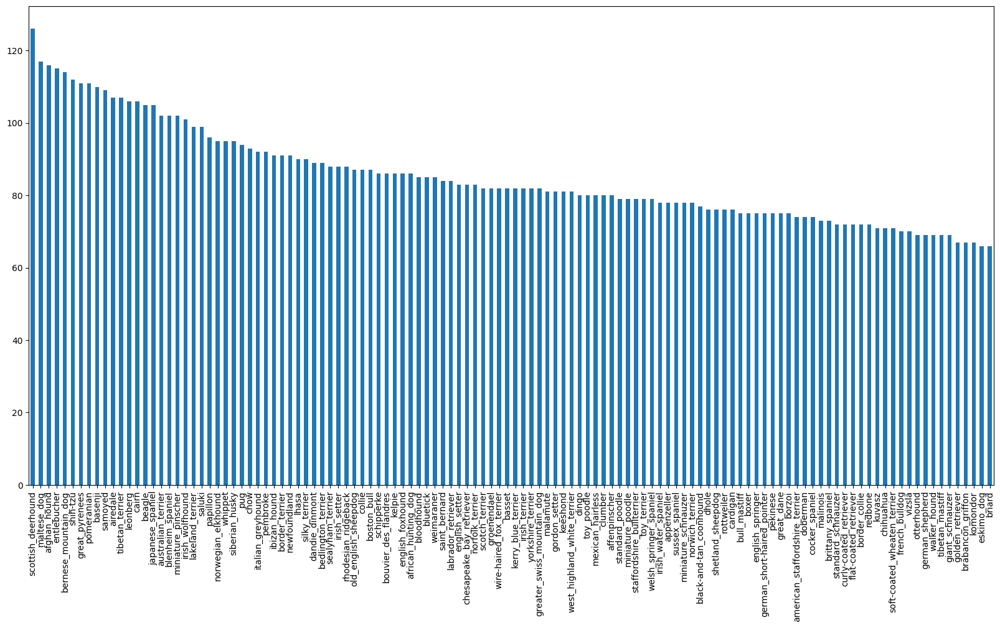

In [3]:
# How many images for each bread
labels_csv["breed"].value_counts().plot.bar(figsize =(20, 10))


In [4]:
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

In [5]:
labels_csv["breed"].value_counts().median()

82.0

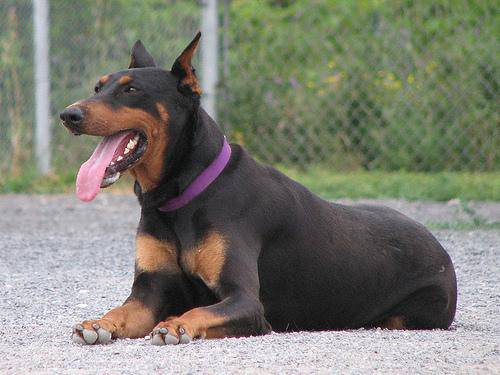

In [6]:
# let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/dog-vision-project/train/008b1271ed1addaccf93783b39deab45.jpg")

In [7]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Colab Notebooks/dog-vision-project/train/"+fname+".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/dog-vision-project/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-pro

In [8]:
# Check wether number of file name matches wtih the actual image files
import os
if len(os.listdir("/content//drive/MyDrive/Colab Notebooks/dog-vision-project/train/")) == len(filenames):
  print("Length matches")
else:
   print("Length not matches")

Length matches


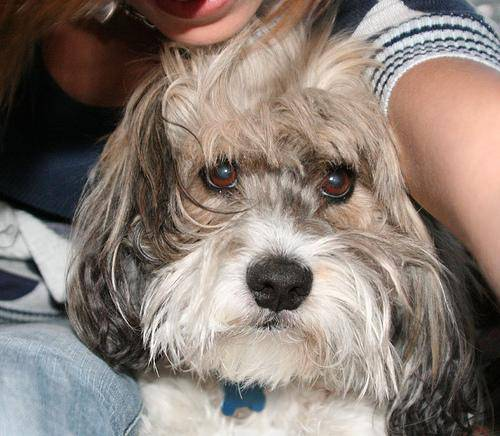

In [9]:
Image(filenames[900])

In [10]:
labels_csv["id"][900], labels_csv["breed"][900], filenames[900][-50:]

('16052ac2a6ff7f1fbbc85885d2a7c467',
 'lhasa',
 'project/train/16052ac2a6ff7f1fbbc85885d2a7c467.jpg')

In [11]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
# See if labels are equal to filenames
if len(labels) == len(filenames):
  print("Equall len for labels and features")
else :
  print("Something wrong labels does not match features(Images)")

Equall len for labels and features


In [13]:
# Find unique labels
unique_breed = np.unique(labels)
len(unique_breed)

120

In [14]:
# Turn every label into a boolean array
boolean_labels = [labels == unique_breed for labels in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [15]:
len(boolean_labels)

10222

In [16]:
# Turnig boolean array into integers
boolean_labels[0].astype(int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

# Creating our own validation set

Since the dataset from Kaggel does't come with a validation set, we'er going to create one own

In [17]:
# Setup X & Y vaariables
x = filenames
y = boolean_labels

In [18]:
len(filenames)

10222

We'er goin to start off experimenting with ~1000 images and increase as needed.


In [19]:
NUMBER_IMAGES = 1000 #@param{type:"slider", min: 1000, max:10000, step:100}

In [20]:
from ctypes import sizeof
from sklearn.model_selection import train_test_split

# Split them into training and testing data
x_train, x_test, y_train, y_test = train_test_split(x[:NUMBER_IMAGES], y[:NUMBER_IMAGES], test_size = 0.2)

len(x_train), len(y_train), len(x_test), len(y_test)

(800, 800, 200, 200)

## Preproscessing images (turning images into tensors)

 1. Take image file path as input
 2. Use Tensorflow to read and save it to a variable, `image`
 3. Turn out `image` into Tensors
 4. Resize the `image` to be a shape of (224, 224)
 5. Return the modified image

In [21]:
# 1. Taking inmage
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [22]:
# 2.converting numpy array image into tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [23]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and converts into a tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels(Red, green, blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0 -- 255 to 0 - 1   (Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image
  image = tf.image.resize(image, size =[IMG_SIZE,IMG_SIZE])

  return image

In [24]:
tensor = tf.io.read_file(filenames[34])

In [25]:
tensor = tf.image.decode_jpeg(tensor, channels=3)

## Turning our data into batches

Why turn our data into batches?

Let's say you are trying to process 10000+ images in oune go...  they all might not fit into memory

So that's why we do about 32 images at a time

In order to use Tensorflow effectively , we need oour data in the form of tensors tuples which look like this:
`(image, label)`


In [26]:
# Create a function to return a tupel
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

# Turn Data into Batches

In [27]:
# Define batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Create batches of data out of image x and label y pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  if test_data :
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)

  elif valid_data:
    print("Creating validation data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),  #filepath
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [28]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_test, y_test, valid_data=True)

Creating training data batches...
Creating validation data batches....


In [29]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualize Data Batches

In [30]:
import matplotlib.pyplot as plt

# Create a function for viewing in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breed[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

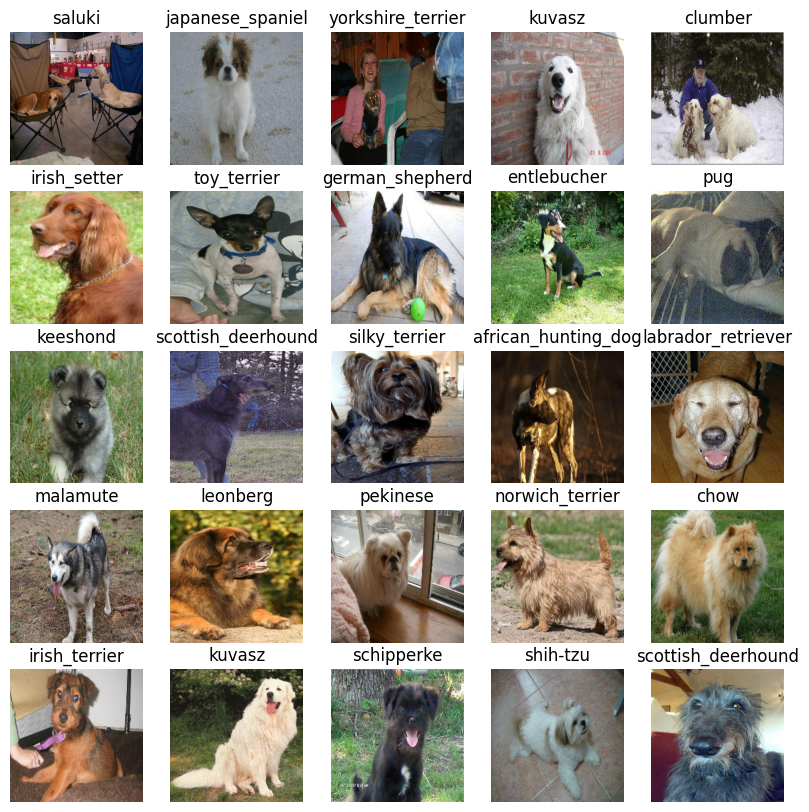

In [31]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

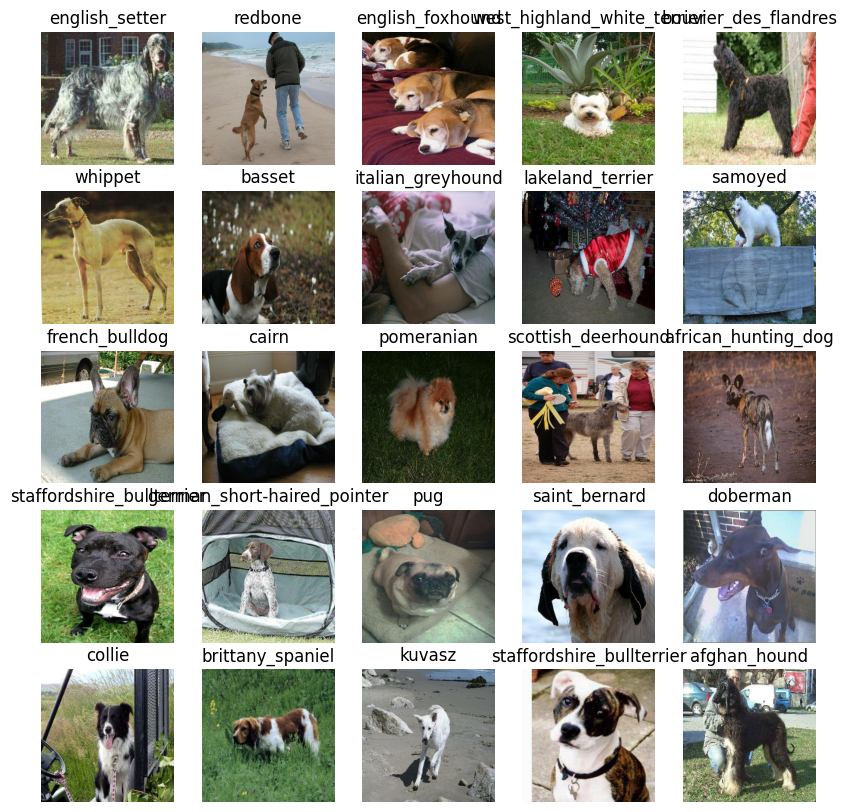

In [32]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Creating and training a model.

Now our data is ready now lets model our data.

Before we build a model, there are a few things we need to define:

* The input shape (images, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.

In [33]:
#setting up input shape to our model.
# Setting up input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setting up output shape of the model
OUTPUT_SHAPE = len(unique_breed) # number of unique labels

# Setting up model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got the inputs, outputs and model we're using ready to go. We can start to put them together

There are many ways of building a model in TensorFlow but one of the best ways to get started is to use the Keras API.

Knowing this, let's create a function which:

Takes the input shape, output shape and the model we've chosen's URL as parameters.
* Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells it what kind of input shape it'll be getting).
Returns the model.

In [34]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [35]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [36]:
 # Load the TensorBoard notebook extension
%load_ext tensorboard

In [37]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/dog-vision-project/Data/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

# Early Stopping Callback

Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

In [38]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

# Training a model (On a subset of data)
Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

We do this to make sure everything is working. And if it is, we can step it up later and train on the entire training dataset.

The final parameter we'll define before training is NUM_EPOCHS (also known as number of epochs).

NUM_EPOCHS defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

If NUM_EPOCHS=1, the model will only look at the data once and will probably score badly because it hasn't a chance to correct itself

In [39]:
NUM_EPOCHS = 100
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

  return model

In [40]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 114s 3s/step - loss: 4.5879 - accuracy: 0.0975 - val_loss: 3.3756 - val_accuracy: 0.3150
Epoch 2/100
25/25 [==============================] - 5s 210ms/step - loss: 1.6492 - accuracy: 0.6762 - val_loss: 2.1703 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 7s 270ms/step - loss: 0.5748 - accuracy: 0.9300 - val_loss: 1.6682 - val_accuracy: 0.5450
Epoch 4/100
25/25 [==============================] - 4s 173ms/step - loss: 0.2574 - accuracy: 0.9925 - val_loss: 1.4595 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 4s 147ms/step - loss: 0.1514 - accuracy: 0.9975 - val_loss: 1.3753 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 5s 191ms/step - loss: 0.1029 - accuracy: 1.0000 - val_loss: 1.3352 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================]

# Checking the TensorBoard logs
The tensorboard magic function(%tensorbord) will access the log files created eariler and visualize its contents.

In [49]:
!kill 5872

In [50]:
%tensorboard --logdir=./content/drive/MyDrive/Colab\ Notebooks/dog-vision-project/Data/logs

Output hidden; open in https://colab.research.google.com to view.

# Making and evaluating predictions using a trained model


In [42]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 1s 95ms/step


array([[2.2927921e-05, 5.5843266e-03, 2.5030673e-02, ..., 8.1413076e-04,
        8.2248921e-04, 2.0190499e-04],
       [8.0445147e-04, 4.7415473e-05, 4.7458947e-05, ..., 2.7243367e-03,
        2.4979419e-04, 1.0314919e-03],
       [4.9909842e-05, 8.2162296e-06, 3.7891904e-04, ..., 1.4858423e-03,
        1.4792375e-02, 1.0075736e-03],
       ...,
       [7.8137462e-05, 1.5522151e-05, 3.7006133e-03, ..., 3.0191001e-04,
        5.4839981e-04, 9.3330309e-05],
       [7.8069465e-04, 7.5845141e-04, 1.2528521e-04, ..., 1.2230638e-05,
        3.7115649e-04, 9.7291508e-05],
       [2.7163820e-03, 5.2178086e-04, 8.8695693e-04, ..., 3.6436475e-05,
        3.6143877e-06, 6.9740572e-04]], dtype=float32)

In [43]:
# softmax activation
predictions.shape

(200, 120)

Making predictions with our model returns an array with a different value for each label.

In this case, making predictions on the validation data (200 images) returns an array (predictions) of arrays, each containing 120 different values (one for each unique dog breed).

These different values are the probabilities or the likelihood the model has predicted a certain image being a certain breed of dog. The higher the value, the more likely the model thinks a given image is a specific breed of dog.

In [44]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breed[np.argmax(predictions[0])]}") # the predicted label

[2.29279212e-05 5.58432657e-03 2.50306726e-02 4.63902943e-05
 2.94395304e-05 6.61573489e-04 9.44213301e-04 4.17929550e-05
 1.91032968e-03 5.83810106e-05 2.04545824e-04 2.86696921e-03
 5.05715085e-04 1.36438734e-03 3.77730874e-04 8.01599473e-02
 1.44405058e-03 7.43982091e-05 6.19810680e-03 1.86047750e-04
 3.23102024e-04 1.05222600e-04 6.08903938e-04 7.89038604e-04
 5.03708143e-03 2.26507909e-04 2.61960486e-05 3.90992675e-04
 3.36100371e-03 7.01217796e-05 1.18961274e-04 1.99622680e-02
 5.48042823e-03 4.90622483e-02 3.02257901e-03 7.39858137e-04
 5.89922885e-04 6.68851499e-05 3.81010845e-02 8.24283052e-05
 4.23917145e-01 3.06560611e-03 3.68284294e-04 1.54571069e-04
 2.69781388e-02 3.35759505e-05 4.23126714e-03 1.09795516e-03
 7.64230557e-04 3.86065617e-03 3.28547321e-03 9.30203032e-03
 1.86599954e-03 6.02256659e-05 3.64738691e-04 2.29857993e-04
 4.71963314e-03 3.83069797e-04 3.84610903e-04 3.49272266e-02
 9.76490192e-05 5.78228093e-04 1.43207450e-04 9.56070144e-05
 8.88714567e-05 1.940164

In [45]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breed[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'english_setter'

Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

The model hasn't trained on the validation data, during the fit() function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using unbatch()) and then turn it into an iterator using as_numpy_iterator().

Let's make a small function to do so.

In [46]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breed[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.204582  , 0.22811142, 0.18889572],
         [0.257496  , 0.275038  , 0.23382652],
         [0.26758245, 0.27934715, 0.23620988],
         ...,
         [0.2817052 , 0.2071954 , 0.18366598],
         [0.27785352, 0.20526956, 0.18559182],
         [0.2708747 , 0.20028648, 0.18460019]],
 
        [[0.20964934, 0.23317875, 0.19396307],
         [0.24982956, 0.26737157, 0.2261601 ],
         [0.2510754 , 0.2628401 , 0.21970281],
         ...,
         [0.27450982, 0.20000002, 0.1764706 ],
         [0.27161247, 0.19855134, 0.1788736 ],
         [0.26941675, 0.19785689, 0.1821706 ]],
 
        [[0.1747832 , 0.19831263, 0.15909693],
         [0.2003987 , 0.21794072, 0.17672923],
         [0.18828994, 0.20005465, 0.1569174 ],
         ...,
         [0.27637503, 0.20186523, 0.1783358 ],
         [0.27854386, 0.20403408, 0.18435633],
         [0.2826243 , 0.2081145 , 0.19242822]],
 
        ...,
 
        [[0.63455904, 0.62279433, 0.44632372],
         [0.6867075 , 0.6749428 , 0.50246

Now we've got ways to get:

Prediction labels
Validation labels (truth labels)
Validation images Let's make some functions to make these all a bit more visualize.
More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:

Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
Convert the prediction probabilities to a predicted label.
Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [58]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

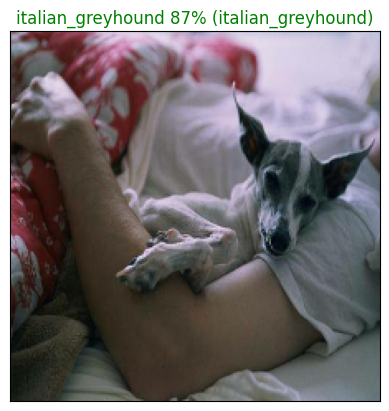

In [59]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,n = 7)

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:

* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using get_pred_label().
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [61]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breed[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

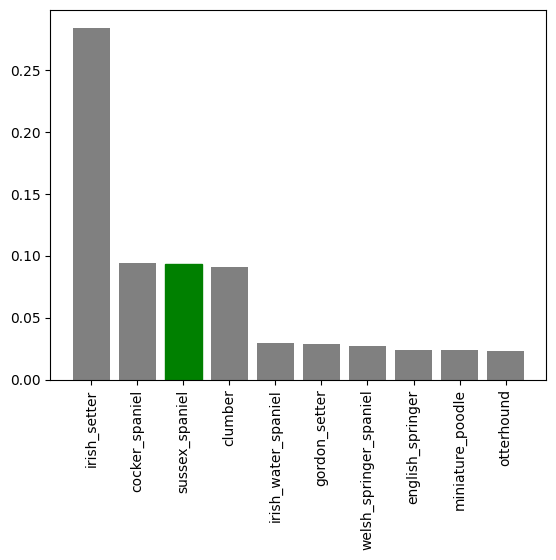

In [66]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=77)

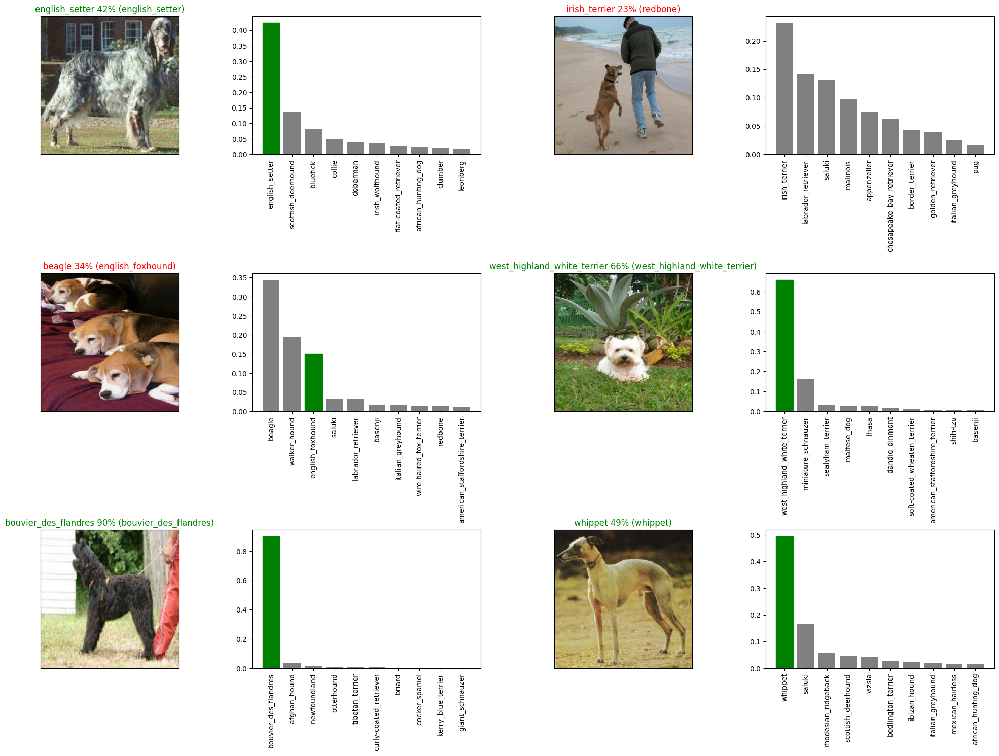

In [67]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and reloading a model

In [68]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/dog-vision-project/Data",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [69]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [70]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/dog-vision-project/Data/20230723-16051690128319-1000-images-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/dog-vision-project/Data/20230723-16051690128319-1000-images-Adam.h5'

Training a model in full dataset
Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to X and all of the training labels to y. Let's check them out.

In [72]:
# Turn full training data in a data batch
full_data = create_data_batches(x, y)

Creating training data batches...


Our data is in a data batch, all we need now is a model.

we've got a function for that too! Let's use create_model() to instantiate another model.

In [73]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [74]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [75]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=5,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/5
320/320 [==============================] - 41s 109ms/step - loss: 1.3556 - accuracy: 0.6671
Epoch 2/5
320/320 [==============================] - 37s 115ms/step - loss: 0.4073 - accuracy: 0.8800
Epoch 3/5
320/320 [==============================] - 34s 107ms/step - loss: 0.2365 - accuracy: 0.9360
Epoch 4/5
320/320 [==============================] - 39s 123ms/step - loss: 0.1543 - accuracy: 0.9634
Epoch 5/5
320/320 [==============================] - 34s 106ms/step - loss: 0.1069 - accuracy: 0.9783


In [77]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/dog-vision-project/Data/20230723-16181690129126-all-images-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/dog-vision-project/Data/20230723-16181690129126-all-images-Adam.h5'

In [84]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Colab Notebooks/dog-vision-project/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/dog-vision-project/test/dcae38083c0e6a8afe15b6f0703bdefa.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/test/df92d68c07ec91b2f67cec77980e00cf.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/test/e6ec1891d8f52a13683c73cabd3045cb.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/test/e64296ffbae301f86c8728834c507cb6.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/test/e145bbebb9ad1e740256e460899a6b67.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/test/dce8d03553ab29570f67a28bf0ee0709.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/test/e4729bf465eac43afb6b04687d4703c3.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/test/dffba3aed600801a5f91c5034bec5b08.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/test/e60df508ef9f70f9c556003827827234.jpg',
 '/content/drive/MyDrive/Colab Notebooks/dog-vision-project/test

In [85]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)
test_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [86]:
# Make predictions on test data batch using the full model
test_predictions = full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 168s 510ms/step
